In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import json
import requests
import seaborn as sns
import pickle as pkl
from functools import reduce

/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)
print(sc.__version__)
sc.settings.n_jobs=30

1.4.5.post1


In [3]:
prefix = '/data/codec/production.run/'

### Load in Data

In [4]:
path = prefix + 'mrna/pkls/aggr/wells.sng.w_covars.pkl'

# with open(path,'wb') as file:
#     pkl.dump(wells, file)
    
with open(path,'rb') as file:
    wells = pkl.load(file)

### Adjust Cell Barcodes, Filter

I'm adjusting the cell barcodes to make them match their well number, which I also did with the ADTs.

In [5]:
for well in wells:
    wells[well]['adata'].obs_names = [i[:16] + '-%s' % well for i in wells[well]['adata'].obs_names]

### Concatenate

In [25]:
concat = wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1, 12)])

In [26]:
path = prefix + 'mrna/obs/label.mito/mito.csv'
concat.obs = concat.obs.join(pd.read_csv(path, index_col=0))

In [27]:
concat.obs['celltype'] = concat.obs['celltype'].str.replace('SOUP','HI_MITO')

In [28]:
concat.var['total_mrna_n_counts'] = concat.X.toarray().sum(axis=0)
concat.obs['mrna_n_counts'] = concat.X.toarray().sum(axis=1)

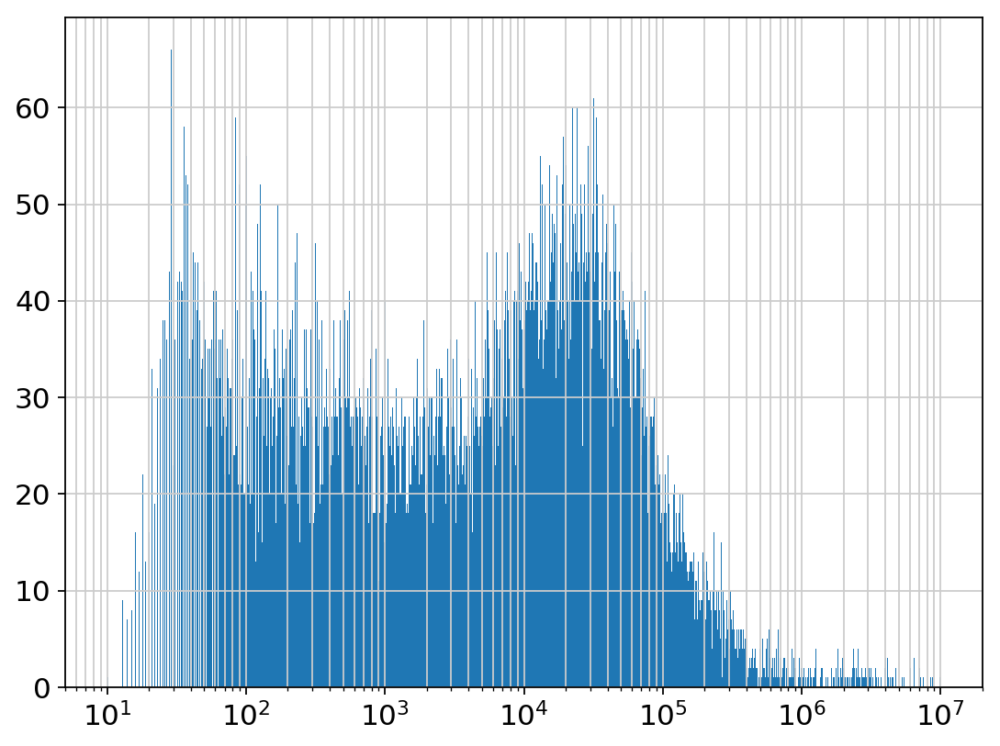

In [29]:
plt.figure(figsize=(8,6))
plt.hist(concat.var['total_mrna_n_counts'].values, bins=np.logspace(np.log10(10),np.log10(1e7), 1000))
plt.grid(False)
plt.grid(True, 'both', 'both')
plt.xscale('log')
# plt.yscale('log')

In [30]:
sc.pp.filter_genes(concat, min_counts=4000, inplace=True)
concat = concat[:, [i for i in concat.var_names if not i.startswith('MT')]].copy()
sc.pp.normalize_per_cell(concat, counts_per_cell_after=1e6)
sc.pp.log1p(concat)
sc.pp.scale(concat)
sc.pp.combat(concat, key='batch',covariates=['cond','free_id'])
sc.pp.scale(concat)
sc.pp.combat(concat, key='celltype',covariates=['cond','free_id'])
sc.pp.scale(concat)
sc.pp.pca(concat, n_comps=200)

filtered out 10221 genes that are detected in less than 4000 counts
normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption.


... storing 'DROPLET.TYPE' as categorical
... storing 'cond' as categorical
... storing 'exp_id' as categorical
... storing 'free_id' as categorical
... storing 'pool_code' as categorical
... storing 'celltype' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 12 batches

Found 2 categorical variables:
	cond, free_id

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

Standardizing Data across genes.

Found 2 batches

Found 2 categorical variables:
	cond, free_id

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

computing PCA with n_comps = 200
    finished (0:06:43)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


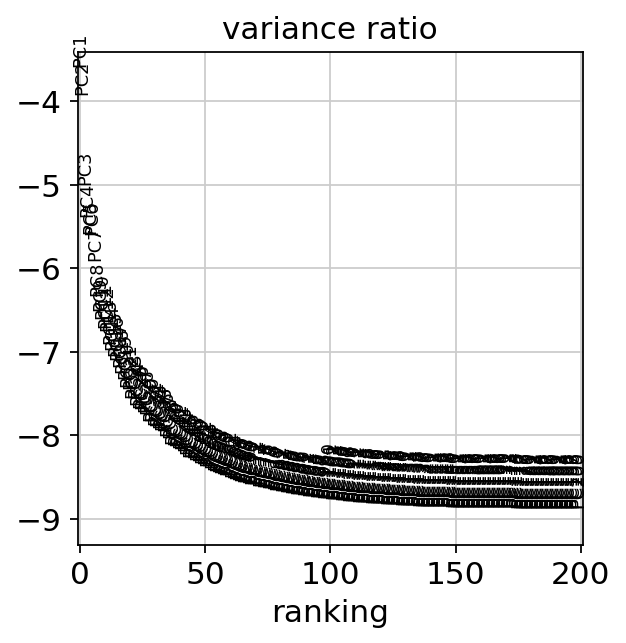

In [31]:
sc.pl.pca_variance_ratio(concat, log=True, n_pcs=200)

In [32]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(concat, n_neighbors=15, n_pcs=150)
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 150
    computed neighbors (0:03:54)
    computed connectivities (0:00:04)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:03:59)


In [33]:
sc.tl.umap(concat)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:50)


In [34]:
sc.tl.leiden(concat, resolution=0.5)

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:08)


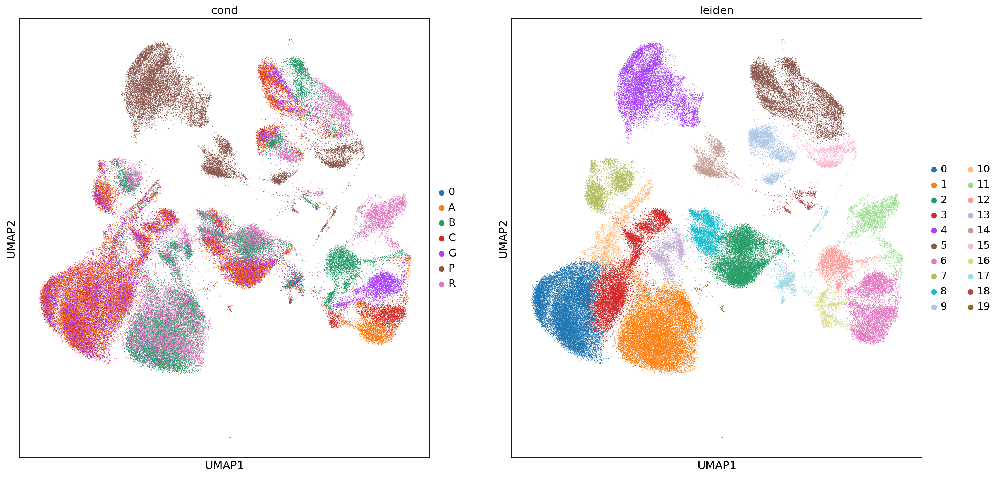

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['cond', 'leiden'], ax):
    sc.pl.umap(concat,color=color,
               ax=ax, show=False, return_fig=False, size=2)

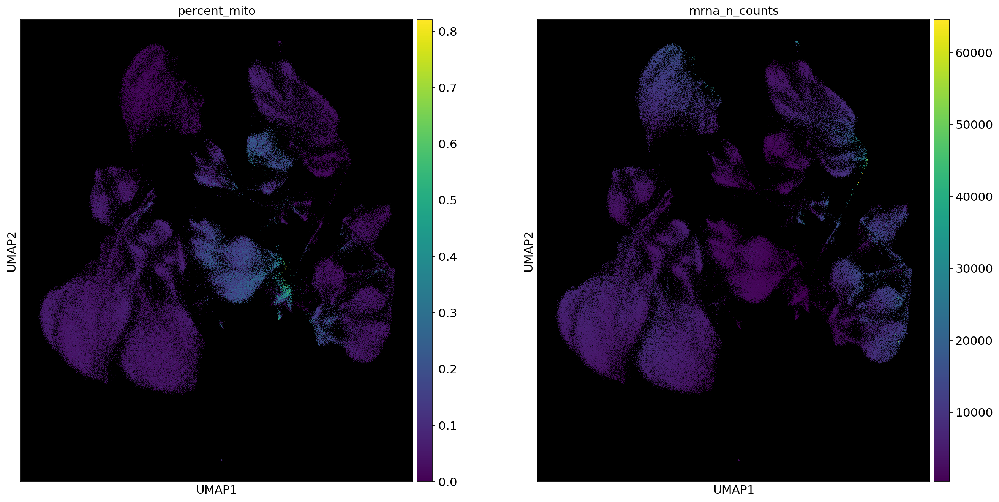

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['percent_mito', 'mrna_n_counts'], ax):
    ax.set_facecolor('black')
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

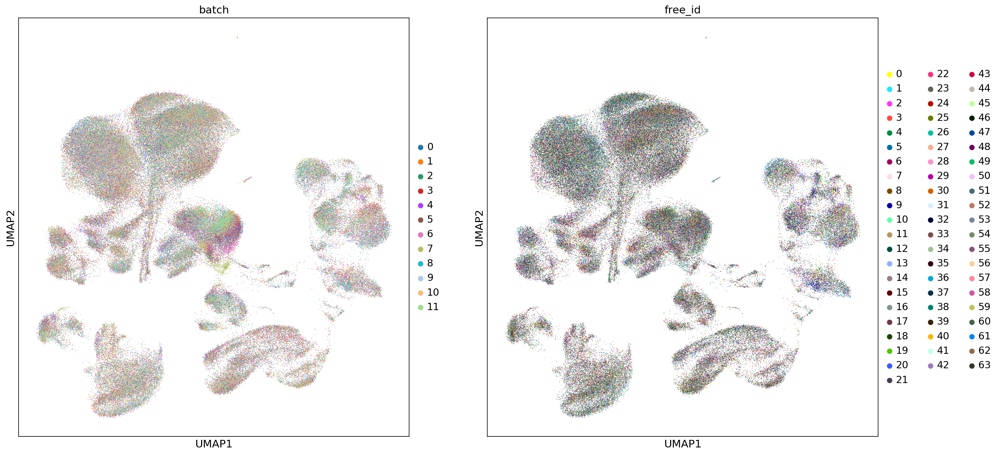

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['batch', 'free_id'], ax):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

In [27]:
clusts = [13, 18, 20, 21]

In [28]:
sub_concat = dict() # put the new subsetted adata objects in a dictionary of concat
for clust in clusts:
    sub_concat[str(clust)] = concat[concat.obs['leiden'] == str(clust)].copy()

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


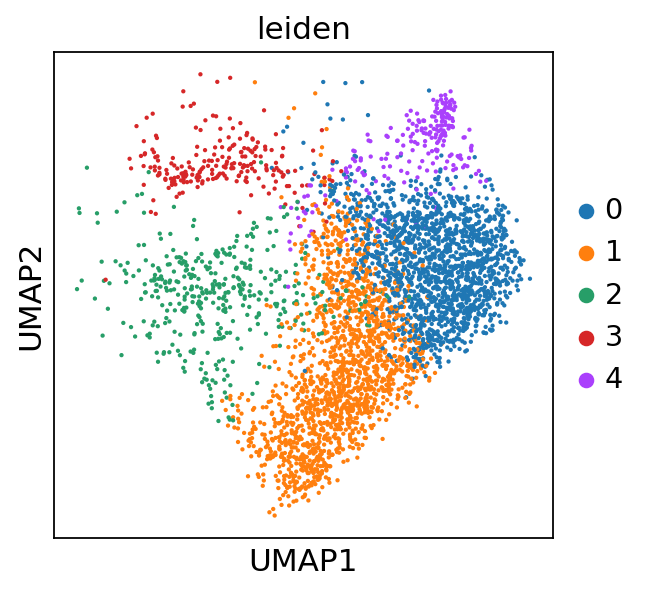

In [30]:
sc.tl.leiden(sub_concat['13'], resolution=0.3) # subcluster them using Leiden
sc.pl.umap(sub_concat['13'], color='leiden', size=15)

In [42]:
groupings = [[0, 1, 3, 4],
             ]
grouped_clusts = [i for j in groupings for i in j]
numclusts = np.unique(sub_concat['13'].obs['leiden'].values.astype(int))
for i in np.setdiff1d(numclusts, grouped_clusts):
    groupings.append([i])

In [43]:
ctdict = dict()
for i in range(len(groupings)):
    ctdict['ct%s' % str(i)] = groupings[i]

sub_concat['13'].obs['celltype'] = sub_concat['13'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        sub_concat['13'].obs['celltype'].replace(str(clust), ct, regex=True, inplace=True)
sub_concat['13'].obs['leiden'] = [i.strip('ct') for i in sub_concat['13'].obs['celltype'].astype('category')]

... storing 'leiden' as categorical


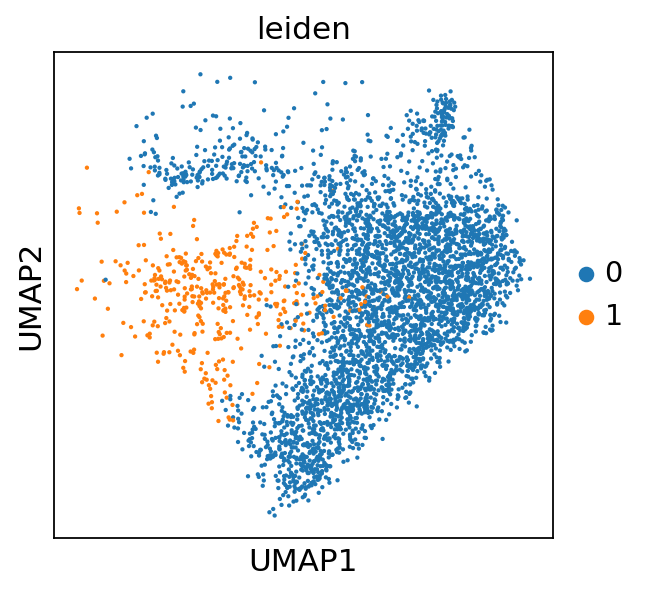

In [44]:
sc.pl.umap(sub_concat['13'], color='leiden', size=15)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


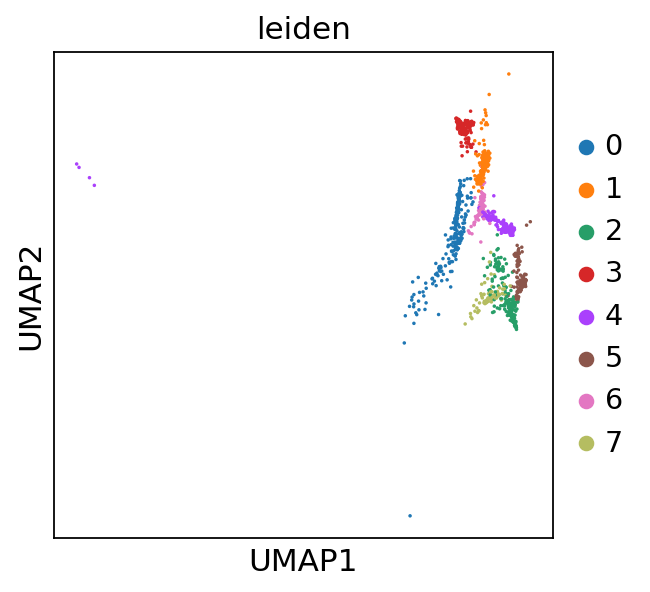

In [36]:
sc.tl.leiden(sub_concat['18'], resolution=0.3) # subcluster them using Leiden
sc.pl.umap(sub_concat['18'], color='leiden', size=10)

... storing 'leiden' as categorical


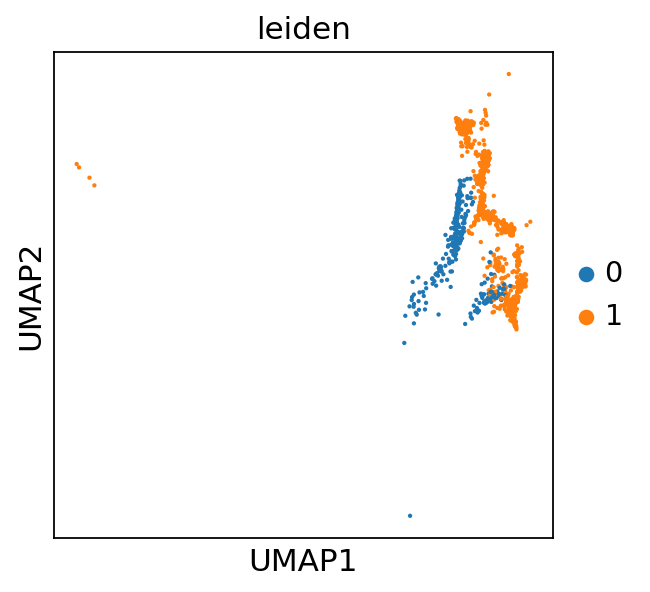

In [45]:
groupings = [[0, 7],
             [1, 2, 3, 4, 5, 6],
             ]
grouped_clusts = [i for j in groupings for i in j]
numclusts = np.unique(sub_concat['18'].obs['leiden'].values.astype(int))
for i in np.setdiff1d(numclusts, grouped_clusts):
    groupings.append([i])

ctdict = dict()
for i in range(len(groupings)):
    ctdict['ct%s' % str(i)] = groupings[i]

sub_concat['18'].obs['celltype'] = sub_concat['18'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        sub_concat['18'].obs['celltype'].replace(str(clust), ct, regex=True, inplace=True)
sub_concat['18'].obs['leiden'] = [i.strip('ct') for i in sub_concat['18'].obs['celltype'].astype('category')]

sc.pl.umap(sub_concat['18'], color='leiden', size=15)

Sometimes, a given resolution will not subcluster a cluster as expected, and so more unintended subclusters arise. If this happens, use the following code to only extract out the desired clusters (note the UMAPs are from a different dataset but the same code still applies):

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


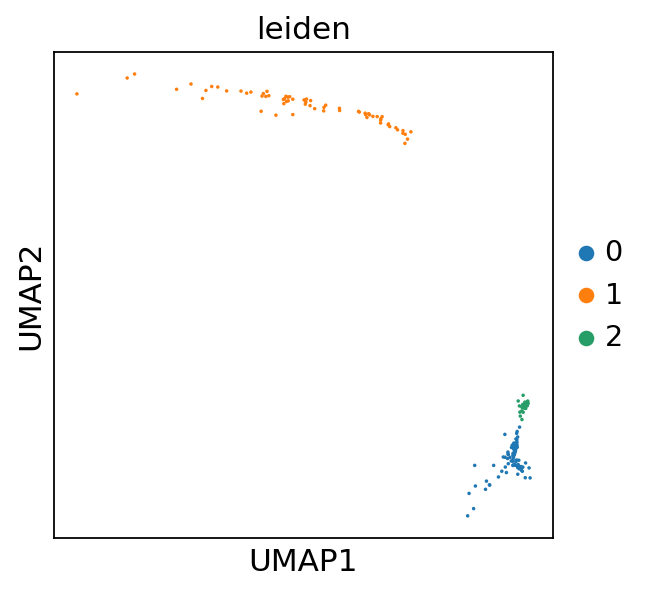

In [40]:
sc.tl.leiden(sub_concat['20'], resolution=0.2) # subcluster them using Leiden
sc.pl.umap(sub_concat['20'], color='leiden', size=10)

... storing 'leiden' as categorical


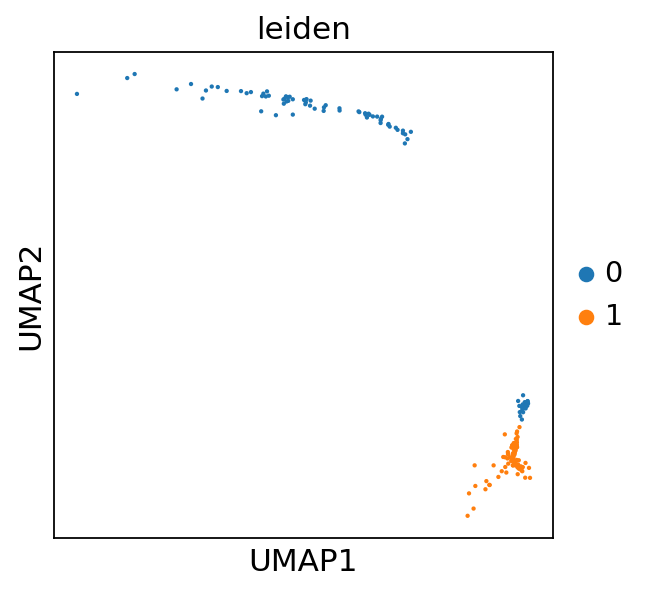

In [47]:
groupings = [[1, 2],
             ]
grouped_clusts = [i for j in groupings for i in j]
numclusts = np.unique(sub_concat['20'].obs['leiden'].values.astype(int))
for i in np.setdiff1d(numclusts, grouped_clusts):
    groupings.append([i])

ctdict = dict()
for i in range(len(groupings)):
    ctdict['ct%s' % str(i)] = groupings[i]

sub_concat['20'].obs['celltype'] = sub_concat['20'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        sub_concat['20'].obs['celltype'].replace(str(clust), ct, regex=True, inplace=True)
sub_concat['20'].obs['leiden'] = [i.strip('ct') for i in sub_concat['20'].obs['celltype'].astype('category')]

sc.pl.umap(sub_concat['20'], color='leiden', size=15)

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


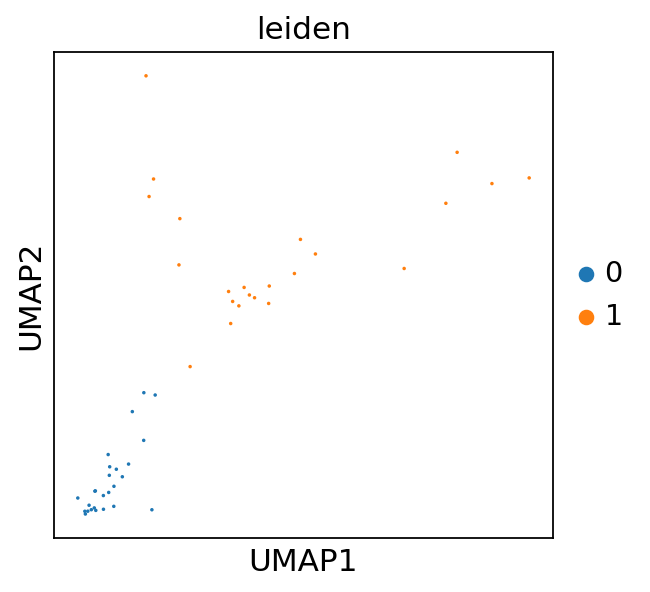

In [41]:
sc.tl.leiden(sub_concat['21'], resolution=0.2) # subcluster them using Leiden
sc.pl.umap(sub_concat['21'], color='leiden', size=10)

In [48]:
def sub_cluster_mapper(adata, sub_adatas):
    '''
    This takes in the adata object and inserts a new leiden column in the `.obs`. 
    
    This function is really convoluted and there's probably a better, simpler way to do it,
    but it should theoretically work for any number of subclusters
    '''
    # ideally you'd make a copy of the adata object here, so we don't have to change the original
    # this would be in case we want to run it multiple times, perhaps the resolutions we put in didn't subset the clusters like we had hoped
    # and we need to run multiple times to adjust the resolution slightly
    
    # this block is to figure out that there are two new subclusters and they should be named 8, 9
    total_new_clusts = 0
    old_clusts = sub_adatas.keys()
    for sub_adata in sub_adatas:
        total_new_clusts += sub_adatas[sub_adata].obs['leiden'].astype(int).unique().max() + 1
    total_added_clusts = total_new_clusts - len(sub_adatas)
    new_clust_names_start = max(adata.obs['leiden'].astype(int))+1
    new_added_clust_names = [str(i) for i in range(new_clust_names_start,
                                                   new_clust_names_start + total_added_clusts)]
    
    # this block is to build a new list of leiden clusters from the old one 
    new_leiden = list()
    leiden_col = adata.obs['leiden'].copy()

    # this builds the new leiden cluster list, now adding a .1, .2, etc. to each new cluster
    for obs in leiden_col.index:
        clust_name = leiden_col.loc[obs]
        if clust_name not in old_clusts or sub_adatas[clust_name].obs.loc[obs, 'leiden'] == '0':
            new_leiden.append(clust_name)
        else:
            new_leiden.append(clust_name + '.%s' % sub_adatas[clust_name].obs.loc[obs,'leiden'])

    # this renames the .1, .2, etc clusters to the new, better names I came up with above (8 and 9)
    new_leiden = pd.Series(new_leiden, index=adata.obs_names)
    added_clusts = np.setdiff1d(new_leiden,adata.obs['leiden'])
    new_leiden.replace(dict(zip(added_clusts, new_added_clust_names)), inplace=True)
    
    # replace the old leiden column, must do these steps sequentially 
    adata.obs['leiden'] = new_leiden.astype(int) # to order the clusters by number
    adata.obs['leiden'] = new_leiden.astype(str) # to convert to string as normal
#     adata.obs['leiden'] = new_leiden.astype('category') # don't do this, it messes things up, just let scanpy do it as it plots
    return adata

In [49]:
concat = sub_cluster_mapper(concat, sub_concat)

... storing 'leiden' as categorical


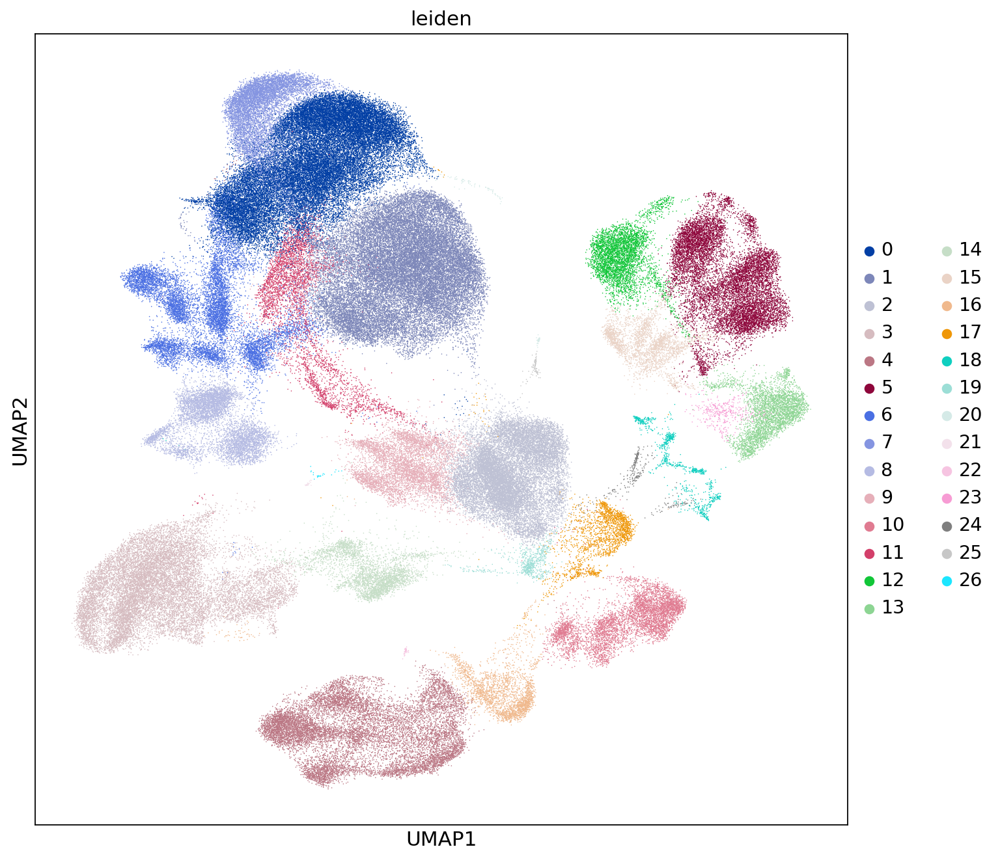

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for color, ax in zip(['leiden'], [ax]):
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=2)

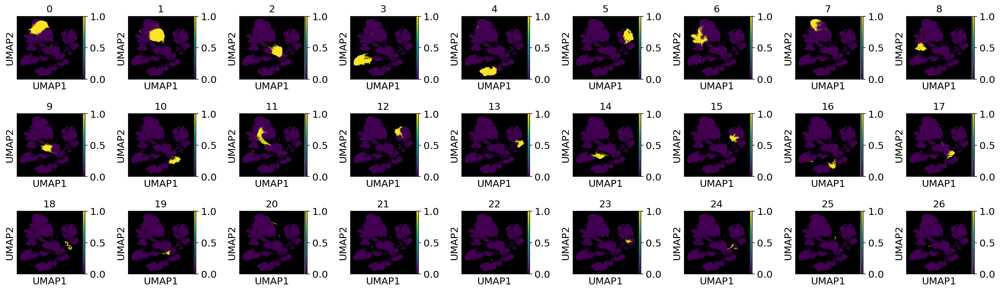

In [54]:
fig, ax = plt.subplots(3,9,figsize=(20,6))
for val, ax in tqdm(zip(concat.obs['leiden'].dtype.categories, np.ravel(ax))):
    concat.obs['val'] = concat.obs['leiden'] == val
    ax.set_facecolor('black')
    sc.pl.umap(concat,color='val', ax=ax, show=False, return_fig=False, title=val)
    concat.obs.drop(columns='val', inplace=True)
plt.tight_layout()

In [56]:
ctdict = dict()
ctdict['LOW_MITO'] = [0, 1, 3, 4, 5, 6, 7, 8, 11, 12, 13, 16, 18, 20, 21, 22]
ctdict['HI_MITO'] = [2, 9, 10, 14, 15, 19, 23, 24, 25, 26]
ctdict['SOUP'] = [17]
concat.obs['celltype'] = concat.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        concat.obs['celltype'].replace(str(clust), ct, regex=True, inplace=True)
concat.obs['celltype'] = concat.obs['celltype'].astype('category')

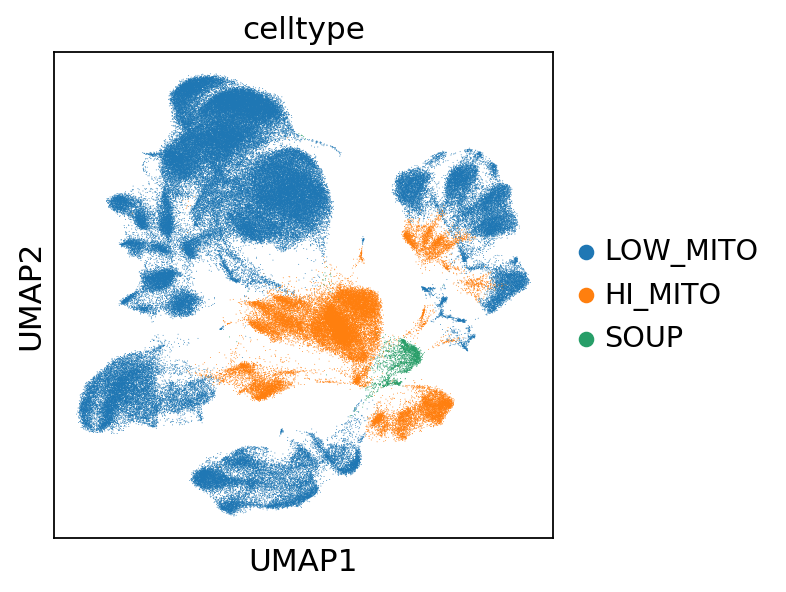

In [58]:
sc.pl.umap(concat,color=['celltype'])

In [61]:
path = prefix + 'mrna/h5ads/concat.1.h5ad'
concat.write_h5ad(path)

In [60]:
prefix

'/data/codec/production.run/'